In [1]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from scipy.integrate import solve_ivp


In [2]:
%load_ext autoreload
%autoreload 2
from lib.draw import plot_3d_with_colors
from lib.utils import shift_coordinates

### Part 1

In [3]:
taken_df = pd.read_csv('data/takens_1.txt', sep=' ', names=['x1', 'x2'], index_col=False)

In [4]:
taken_df.head()

,x1,x2
0,2.168371,-0.546313
1,2.179811,-0.532475
2,2.190028,-0.518940
3,2.198638,-0.506198
4,2.205623,-0.494355


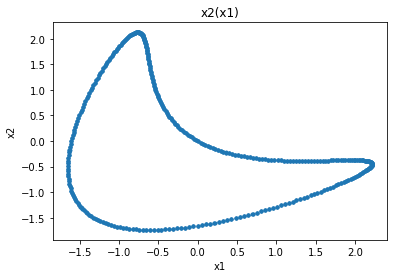

In [21]:
plt.scatter(taken_df.x1, taken_df.x2, marker='.')
plt.xlabel('x1')
plt.ylabel('x2')
plt.title('x2(x1)')
plt.show()

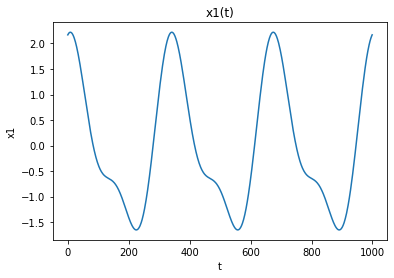

In [22]:
plt.plot(taken_df.index, taken_df.x1)
plt.xlabel('t')
plt.ylabel('x1')
plt.title('x1(t)')
plt.show()

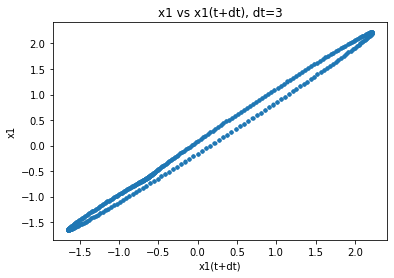

In [24]:
delta_n = 3
plt.scatter(taken_df.x1.shift(periods=-delta_n), taken_df.x1, marker='.')
plt.xlabel('x1(t+dt)')
plt.ylabel('x1')
plt.title('x1 vs x1(t+dt), dt=3')
plt.show()

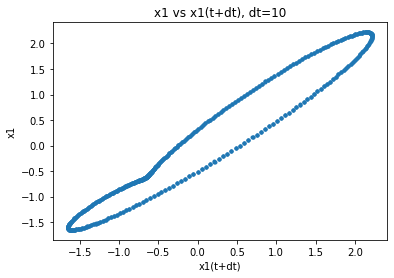

In [25]:
delta_n = 10
plt.scatter(taken_df.x1.shift(periods=-delta_n), taken_df.x1, marker='.')
plt.xlabel('x1(t+dt)')
plt.ylabel('x1')
plt.title('x1 vs x1(t+dt), dt=10')
plt.show()

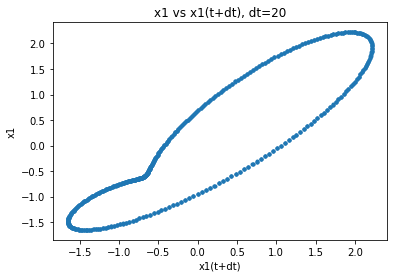

In [26]:
delta_n = 20
plt.scatter(taken_df.x1.shift(periods=-delta_n), taken_df.x1, marker='.')
plt.xlabel('x1(t+dt)')
plt.ylabel('x1')
plt.title('x1 vs x1(t+dt), dt=20')
plt.show()

### Part 2

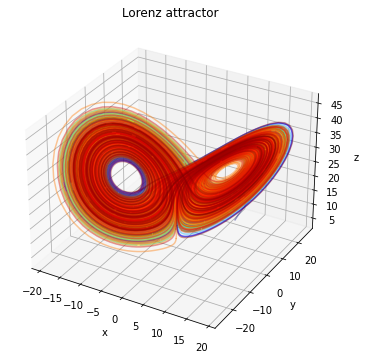

In [10]:
x_0 = 10
y_0 = 10
z_0 = 10

sigma = 10
rho = 28
beta = 8/3

dTau = 0.01
timeEnd = 1000
steps = int(timeEnd/dTau)

def lorenz(t,point,sigma,beta,rho):
    X,Y,Z = point
    dX = -sigma*X + sigma*Y
    dY = -X * Z + rho*X - Y 
    dZ = X*Y-beta*Z
    return dX,dY,dZ

t = np.linspace(0, timeEnd, steps)
soln = solve_ivp(lorenz, (0, timeEnd), (x_0,y_0,z_0), args=(sigma, beta, rho),dense_output=True)
x, y, z = soln.sol(t)

plot_3d_with_colors(x, y, z, 'x', 'y', 'z', 'Lorenz attractor')


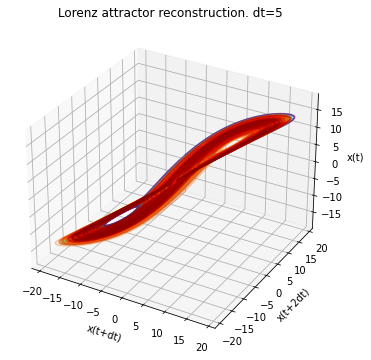

In [27]:
x_original, x_shifted_1, x_shifted_2 = shift_coordinates(x, 2, 5)
plot_3d_with_colors(x_shifted_1, x_shifted_2, x_original, 'x(t+dt)', 'x(t+2dt)', 'x(t)', 'Lorenz attractor reconstruction. dt=5')

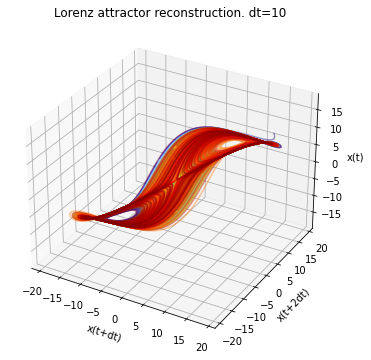

In [28]:
x_original, x_shifted_1, x_shifted_2 = shift_coordinates(x, 2, 10)
plot_3d_with_colors(x_shifted_1, x_shifted_2, x_original, 'x(t+dt)', 'x(t+2dt)', 'x(t)', 'Lorenz attractor reconstruction. dt=10')

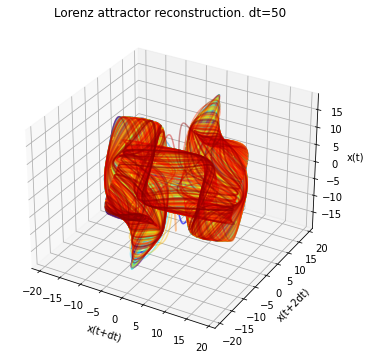

In [30]:
x_original, x_shifted_1, x_shifted_2 = shift_coordinates(x, 2, 50)
plot_3d_with_colors(x_shifted_1, x_shifted_2, x_original, 'x(t+dt)', 'x(t+2dt)', 'x(t)', 'Lorenz attractor reconstruction. dt=50')

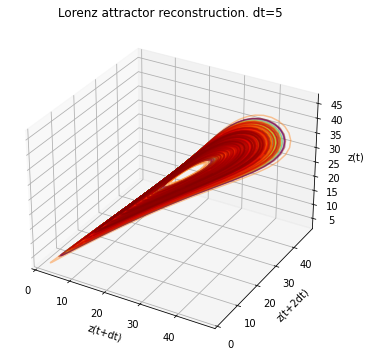

In [31]:
z_original, z_shifted_1, z_shifted_2 = shift_coordinates(z, 2, 5)
plot_3d_with_colors(z_shifted_1, z_shifted_2, z_original, 'z(t+dt)', 'z(t+2dt)', 'z(t)', 'Lorenz attractor reconstruction. dt=5')

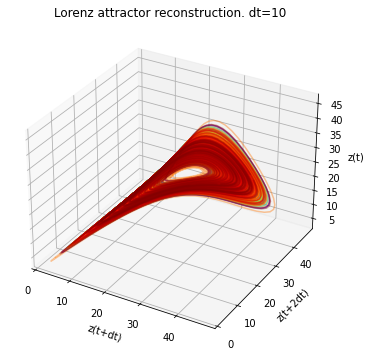

In [32]:
z_original, z_shifted_1, z_shifted_2 = shift_coordinates(z, 2, 10)
plot_3d_with_colors(z_shifted_1, z_shifted_2, z_original, 'z(t+dt)', 'z(t+2dt)', 'z(t)', 'Lorenz attractor reconstruction. dt=10')

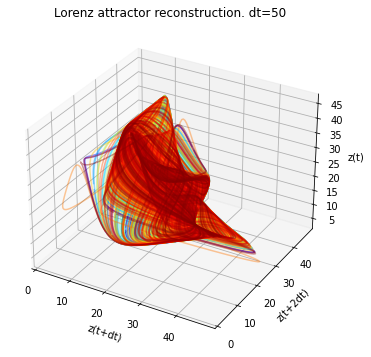

In [33]:
z_original, z_shifted_1, z_shifted_2 = shift_coordinates(z, 2, 50)
plot_3d_with_colors(z_shifted_1, z_shifted_2, z_original, 'z(t+dt)', 'z(t+2dt)', 'z(t)', 'Lorenz attractor reconstruction. dt=50')